### Temp

Stages and important hurdles: Data Extraction issues, Df formation issues, MV issues, Standardisation issues with imputation and indexation etc, Algo selection taking into account missing values

How it happened:
1. First issue was extracting the data from a slow and unresponsive API. __Solution:__ Multiple parallel AWS instances used to acquire the data.
2. Forming a df, several issues
3. Indexing temperature rather than using actual values. Give rationale.
4. Not indexing other features but using their country wise mean. Give rationale. Mainly because of the increase in the number of missing values.
5. Choice of XGboost was simple as it deals with missing values and imputation etc were not working because of the random nature of missing values present and high frequency and i would have had to lose a lot of data to get a clean dataset. Mention that you tried removing all MVs, simple imputation, as well as iterative imputation.

### Initialization cells

In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import pickle
import json
import pandas_profiling
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import Imputer
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from xgboost import plot_importance
from xgboost import plot_tree
from xgboost import XGBRegressor
import scipy
from scipy.cluster import hierarchy as hc
from matplotlib import pyplot as plt
from pdpbox import pdp, info_plots
from plotnine import *
import seaborn as sns

In [19]:
print(Train.shape, Val.shape)

(10318, 194) (184, 194)


In [2]:
# Train=pd.read_pickle('Train3') # Standardised(countrywise) Df with high MV countries deleted, all missing values in target feature deleted, 
# Train=pd.read_pickle('Train7') # All features indexed using base year 1960
Train=pd.read_pickle('Train6') # Standardised cwise, High MV countries deleted, MV in Temp deleted, Temp converted to index cwise base year 1960
Val=pd.read_pickle('Val6') #184 values extracted from Train6
# Val=pd.read_pickle('Val')

# CountryWiseDf=pickle.load(open('CountryWiseDf','rb')) # This is now with the list of high MV countries deleted
# Train=Train.drop(labels=['country'],axis=1)

### Standardisation, Dealing with MVs, Forming final Df to use

#### All working

In [ ]:
CountryWiseDf={s:d for s,d in Train2.groupby('country')}

ctr=ColumnTransformer([('strange',StandardScaler(),[i for i in Train.columns if i not in ['country','date']])],verbose=True,remainder='passthrough')
strain=ctr.fit_transform(Train)
strain=pd.DataFrame(strain,columns=cols)

cols=Train.columns.tolist()

cols=cols[+2:]+cols[:+2]

StandardisedDfs2={} # Dict of countrywise standardised Dfs
for s,d in CountryWiseDf.items():
    mid=d.drop(labels=['country','date'],axis=1)
    new=StandardScaler().fit_transform(mid)
    new=pd.DataFrame(new,columns=mid.columns)
    StandardisedDfs2[s]=new

StandardisedDfs={} # Dict of countrywise standardised Dfs
for s,d in CountryWiseDf.items():
    ctr=ColumnTransformer([('strange',StandardScaler(),[i for i in d.columns if i not in ['country','date']])],verbose=True,remainder='passthrough')
    strain=ctr.fit_transform(d)
    strain=pd.DataFrame(strain,columns=cols)
    StandardisedDfs[s]=strain

Train3=Train2[Train.columns]

crap=[j for i,j in StandardisedDfs.items()]

Train=pd.concat(crap)

dropcrap=(crap[crap['Temp(C)'].isnull()]).index

crap2=crap.drop(index=dropcrap)

#### Setting up Val Set

In [169]:
Val=Train[Train['date']==2012]

Train.drop(index=Val.index,inplace=True)

Train.reset_index(inplace=True)

Val.reset_index(inplace=True)

Train.drop(labels='index',axis=1,inplace=True)

Val.drop(labels='index',axis=1,inplace=True)

print(Val.shape, Train.shape)

(0, 194) (10318, 194)


#### Reorganizing dataframe without scaling target feature and using difference over base year instead of actual temp

In [27]:
# For getting original Train back
Train=pd.read_pickle('Train3')
dropcrap=(Train[Train['Temp(C)'].isnull()]).index
Train=Train.drop(index=dropcrap);

In [28]:
CountryWiseDf={s:d for s,d in Train.groupby('country')}

for i,g in CountryWiseDf.items():
    for d in g.columns:
        if d!='country':
            if d!='date':
                base=float(g[g['date']=='1960'][d])
                g[d]=g[d]-base

In [19]:
newdfs=[j for i,j in CountryWiseDf.items()]
Train=pd.concat(newdfs)

In [24]:
Train.drop(labels='index',axis=1,inplace=True)

In [31]:
Train2

,Urban_population_(%_of_total),Urban_population_growth_(annual_%),Rural_population_(%_of_total_population),Rural_population_growth_(annual_%),"Population,_male_(%_of_total)","Population,_female_(%_of_total)",Population_growth_(annual_%),"Age_dependency_ratio,_young_(%_of_working-age_population)","Age_dependency_ratio,_old_(%_of_working-age_population)",Population_density_(people_per_sq._km_of_land_area),...,Access_to_electricity_(%_of_rural_population),Access_to_electricity_(%_of_urban_population),Renewable_energy_consumption(%_in_TFEC),Renewable_energy_electricity_output_(GWh),Renewable_electricity_(%_in_total_electricity_output),Energy_intensity_level_of_primary_energy_(MJ/$2005_PPP),Prec(C),country,date,Temp(C)
0,1.27748,-0.154352,-1.27748,0.400473,0.453315,-0.453315,0.3983,0.19214,-0.1861,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.00666,Afghanistan,2012,0.668093
1,1.23605,-0.260973,-1.23605,0.330572,0.329448,-0.329448,0.321642,0.524528,-0.307409,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.18477,Afghanistan,2011,1.29964
2,1.19482,-0.434468,-1.19482,0.219392,0.310728,-0.310728,0.199694,0.778643,-0.434783,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.477858,Afghanistan,2010,1.76242
3,1.15397,-0.581497,-1.15397,0.123219,0.43681,-0.43681,0.0945811,0.835788,-0.648612,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.28084,Afghanistan,2009,1.79493
4,1.11333,-0.613923,-1.11333,0.101509,0.69209,-0.69209,0.0701742,0.830158,-0.851809,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.20251,Afghanistan,2008,1.82165
5,1.07288,-0.462977,-1.07288,0.198968,1.01078,-1.01078,0.17492,0.773751,-1.05717,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.190667,Afghanistan,2007,1.69728
6,1.03262,-0.173273,-1.03262,0.388844,1.28912,-1.28912,0.379275,0.692377,-1.28886,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-0.107344,Afghanistan,2006,1.84995
7,0.992755,0.222306,-0.992755,0.645292,1.44845,-1.44845,0.65634,0.60928,-1.56261,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.699738,Afghanistan,2005,1.68023
8,0.953086,0.44033,-0.953086,0.912653,1.44269,-1.44269,0.914673,0.775679,-1.42795,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.53975,Afghanistan,2004,2.24216
9,0.924359,0.505334,-0.924359,1.08003,1.28637,-1.28637,1.06538,0.925228,-1.26141,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.868523,Afghanistan,2003,1.38883


In [ ]:
dropcrap=(Train[Train['Temp(C)'].isnull()]).index

Train=Train.drop(index=dropcrap);

Train.shape

CountryWiseDf={s:d for s,d in Train.groupby('country')}

cols=Train.columns.tolist()

cols=cols[+2:]+cols[:+2];cols=cols[:-4]+cols[-3:]+cols[-4:-3];cols

StandardisedDfs={} # Dict of countrywise standardised Dfs
for s,d in CountryWiseDf.items():
    ctr=ColumnTransformer([('strange',StandardScaler(),[i for i in d.columns if i not in ['country','date','Temp(C)']])],verbose=True,remainder='passthrough')
    strain=ctr.fit_transform(d)
    strain=pd.DataFrame(strain,columns=cols)
    StandardisedDfs[s]=strain

for i,g in StandardisedDfs.items():
        base=float(g[g['date']=='1960']['Temp(C)'])
        g['Temp(C)']=g['Temp(C)']-base

newdfs=[j for i,j in StandardisedDfs.items()]
Train=pd.concat(newdfs)
Train=Train.infer_objects()

    
newdfs=[j for i,j in StandardisedDfs.items()]
Train2=pd.concat(newdfs)

Train2=Train[cols]

### Xgboost

#### Setting up X & Y

In [3]:
Remove=json.load(open('Remove2.json'))

In [4]:
TrainVal=pd.concat([Train,Val])
TrainVal.drop(labels=Remove,axis=1,inplace=True)

In [5]:
# Train['country']=Train['country'].astype('category').cat.codes

Xtrain= Train.loc[:,Train.columns!='Temp(C)']; ytrain= Train.loc[:,'Temp(C)']
Xval= Val.loc[:,Train.columns!='Temp(C)']; yval= Val.loc[:,'Temp(C)']

Xtrain.drop(labels=Remove,axis=1,inplace=True);Xtrain.drop(labels='date',axis=1,inplace=True)
Xval.drop(labels=Remove,axis=1,inplace=True);Xval.drop(labels='date',axis=1,inplace=True)

#### Model Testing

In [47]:
json.dump(FiList,open('FiList.json','w'))

In [6]:
FiList=json.load(open('FiList.json'))

In [48]:
fi=pd.Series(xgb.feature_importances_,index=Xtrain.columns).sort_values(ascending=False)

FiList=[i for i,j in fi.items()];FiList

In [ ]:
for i in FiList:
    if i in ScoreImpact: continue
    Xtrain1=Xtrain.drop(labels=i,axis=1)
    Xval1=Xval.drop(labels=i,axis=1)
    xgb=XGBRegressor(objective='reg:squaredlogerror',n_jobs=-1,n_estimators=5000,subsample=0.75,colsample_bytree=0.5,\
                colsample_bylevel=0.75,learning_rate=0.06)
    xgb.fit(Xtrain1,ytrain, eval_set=[(Xtrain1,ytrain),(Xval1,yval)],eval_metric='rmse', early_stopping_rounds=50)
    score=xgb.best_score
    ScoreImpact[i]=score

[0]	validation_0-rmse:0.730892	validation_1-rmse:0.597733
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 70 rounds.
[1]	validation_0-rmse:0.713791	validation_1-rmse:0.59291
[2]	validation_0-rmse:0.698142	validation_1-rmse:0.590317
[3]	validation_0-rmse:0.684112	validation_1-rmse:0.587985
[4]	validation_0-rmse:0.671283	validation_1-rmse:0.586193
[5]	validation_0-rmse:0.659426	validation_1-rmse:0.582326
[6]	validation_0-rmse:0.648706	validation_1-rmse:0.580647
[7]	validation_0-rmse:0.639075	validation_1-rmse:0.577507
[8]	validation_0-rmse:0.630086	validation_1-rmse:0.575607
[9]	validation_0-rmse:0.622081	validation_1-rmse:0.574594
[10]	validation_0-rmse:0.61471	validation_1-rmse:0.572885
[11]	validation_0-rmse:0.608235	validation_1-rmse:0.572485
[12]	validation_0-rmse:0.601856	validation_1-rmse:0.569187
[13]	validation_0-rmse:0.596434	validation_1-rmse:0.567721
[14]	validation_0-rmse:0.59

[136]	validation_0-rmse:0.471043	validation_1-rmse:0.469404
[137]	validation_0-rmse:0.470455	validation_1-rmse:0.469224
[138]	validation_0-rmse:0.470012	validation_1-rmse:0.469306
[139]	validation_0-rmse:0.469677	validation_1-rmse:0.469705
[140]	validation_0-rmse:0.469216	validation_1-rmse:0.470318
[141]	validation_0-rmse:0.468634	validation_1-rmse:0.469889
[142]	validation_0-rmse:0.46823	validation_1-rmse:0.470117
[143]	validation_0-rmse:0.467714	validation_1-rmse:0.469794
[144]	validation_0-rmse:0.467428	validation_1-rmse:0.470193
[145]	validation_0-rmse:0.467104	validation_1-rmse:0.468299
[146]	validation_0-rmse:0.466666	validation_1-rmse:0.467792
[147]	validation_0-rmse:0.466154	validation_1-rmse:0.466255
[148]	validation_0-rmse:0.46582	validation_1-rmse:0.466098
[149]	validation_0-rmse:0.465586	validation_1-rmse:0.466068
[150]	validation_0-rmse:0.465264	validation_1-rmse:0.465762
[151]	validation_0-rmse:0.464901	validation_1-rmse:0.464249
[152]	validation_0-rmse:0.464443	validatio

[274]	validation_0-rmse:0.426234	validation_1-rmse:0.439857
[275]	validation_0-rmse:0.425847	validation_1-rmse:0.439776
[276]	validation_0-rmse:0.425637	validation_1-rmse:0.440649
[277]	validation_0-rmse:0.425372	validation_1-rmse:0.440601
[278]	validation_0-rmse:0.424964	validation_1-rmse:0.440587
[279]	validation_0-rmse:0.424722	validation_1-rmse:0.440188
[280]	validation_0-rmse:0.424473	validation_1-rmse:0.440204
[281]	validation_0-rmse:0.4243	validation_1-rmse:0.439674
[282]	validation_0-rmse:0.423994	validation_1-rmse:0.439495
[283]	validation_0-rmse:0.423843	validation_1-rmse:0.439513
[284]	validation_0-rmse:0.423678	validation_1-rmse:0.439534
[285]	validation_0-rmse:0.423401	validation_1-rmse:0.439521
[286]	validation_0-rmse:0.423099	validation_1-rmse:0.43869
[287]	validation_0-rmse:0.422809	validation_1-rmse:0.438654
[288]	validation_0-rmse:0.422524	validation_1-rmse:0.4389
[289]	validation_0-rmse:0.422357	validation_1-rmse:0.438214
[290]	validation_0-rmse:0.422252	validation_1

[411]	validation_0-rmse:0.396031	validation_1-rmse:0.413343
[412]	validation_0-rmse:0.395889	validation_1-rmse:0.412771
[413]	validation_0-rmse:0.395769	validation_1-rmse:0.413364
[414]	validation_0-rmse:0.395541	validation_1-rmse:0.413181
[415]	validation_0-rmse:0.395396	validation_1-rmse:0.413287
[416]	validation_0-rmse:0.395231	validation_1-rmse:0.413729
[417]	validation_0-rmse:0.395	validation_1-rmse:0.414016
[418]	validation_0-rmse:0.394917	validation_1-rmse:0.413998
[419]	validation_0-rmse:0.394745	validation_1-rmse:0.413733
[420]	validation_0-rmse:0.394499	validation_1-rmse:0.413443
[421]	validation_0-rmse:0.394338	validation_1-rmse:0.41321
[422]	validation_0-rmse:0.394122	validation_1-rmse:0.412905
[423]	validation_0-rmse:0.393988	validation_1-rmse:0.413405
[424]	validation_0-rmse:0.393777	validation_1-rmse:0.41343
[425]	validation_0-rmse:0.393617	validation_1-rmse:0.413315
[426]	validation_0-rmse:0.393437	validation_1-rmse:0.413296
[427]	validation_0-rmse:0.39321	validation_1-

[549]	validation_0-rmse:0.37334	validation_1-rmse:0.410315
[550]	validation_0-rmse:0.373224	validation_1-rmse:0.410217
[551]	validation_0-rmse:0.373068	validation_1-rmse:0.410397
[552]	validation_0-rmse:0.372866	validation_1-rmse:0.410259
[553]	validation_0-rmse:0.372781	validation_1-rmse:0.410298
[554]	validation_0-rmse:0.372613	validation_1-rmse:0.410492
[555]	validation_0-rmse:0.37245	validation_1-rmse:0.410235
[556]	validation_0-rmse:0.372218	validation_1-rmse:0.410213
[557]	validation_0-rmse:0.372061	validation_1-rmse:0.410288
[558]	validation_0-rmse:0.371983	validation_1-rmse:0.410318
[559]	validation_0-rmse:0.371842	validation_1-rmse:0.410366
[560]	validation_0-rmse:0.371765	validation_1-rmse:0.410031
[561]	validation_0-rmse:0.371693	validation_1-rmse:0.409527
[562]	validation_0-rmse:0.371609	validation_1-rmse:0.409425
[563]	validation_0-rmse:0.371561	validation_1-rmse:0.409427
[564]	validation_0-rmse:0.371423	validation_1-rmse:0.409408
[565]	validation_0-rmse:0.371328	validatio

[686]	validation_0-rmse:0.355691	validation_1-rmse:0.404329
[687]	validation_0-rmse:0.35558	validation_1-rmse:0.404414
[688]	validation_0-rmse:0.35545	validation_1-rmse:0.404569
[689]	validation_0-rmse:0.355246	validation_1-rmse:0.404308
[690]	validation_0-rmse:0.355189	validation_1-rmse:0.404417
[691]	validation_0-rmse:0.355001	validation_1-rmse:0.404506
[692]	validation_0-rmse:0.354863	validation_1-rmse:0.404912
[693]	validation_0-rmse:0.354722	validation_1-rmse:0.404686
[694]	validation_0-rmse:0.35455	validation_1-rmse:0.404867
[695]	validation_0-rmse:0.354438	validation_1-rmse:0.404861
[696]	validation_0-rmse:0.354383	validation_1-rmse:0.404819
[697]	validation_0-rmse:0.35421	validation_1-rmse:0.404937
[698]	validation_0-rmse:0.35403	validation_1-rmse:0.405287
[699]	validation_0-rmse:0.353862	validation_1-rmse:0.405265
[700]	validation_0-rmse:0.353804	validation_1-rmse:0.405212
[701]	validation_0-rmse:0.353679	validation_1-rmse:0.405106
[702]	validation_0-rmse:0.353523	validation_1

[823]	validation_0-rmse:0.339177	validation_1-rmse:0.399855
[824]	validation_0-rmse:0.339121	validation_1-rmse:0.400039
[825]	validation_0-rmse:0.339026	validation_1-rmse:0.400138
[826]	validation_0-rmse:0.338873	validation_1-rmse:0.400227
[827]	validation_0-rmse:0.338783	validation_1-rmse:0.400262
[828]	validation_0-rmse:0.338723	validation_1-rmse:0.399714
[829]	validation_0-rmse:0.338591	validation_1-rmse:0.399705
[830]	validation_0-rmse:0.33846	validation_1-rmse:0.399701
[831]	validation_0-rmse:0.338297	validation_1-rmse:0.399613
[832]	validation_0-rmse:0.338185	validation_1-rmse:0.399414
[833]	validation_0-rmse:0.338055	validation_1-rmse:0.399115
[834]	validation_0-rmse:0.337912	validation_1-rmse:0.399368
[835]	validation_0-rmse:0.337749	validation_1-rmse:0.399222
[836]	validation_0-rmse:0.337662	validation_1-rmse:0.399152
[837]	validation_0-rmse:0.337481	validation_1-rmse:0.399141
[838]	validation_0-rmse:0.337454	validation_1-rmse:0.399082
[839]	validation_0-rmse:0.337253	validati

[960]	validation_0-rmse:0.324788	validation_1-rmse:0.39413
[961]	validation_0-rmse:0.32462	validation_1-rmse:0.394004
[962]	validation_0-rmse:0.324453	validation_1-rmse:0.394169
[963]	validation_0-rmse:0.324307	validation_1-rmse:0.394343
[964]	validation_0-rmse:0.32416	validation_1-rmse:0.394165
[965]	validation_0-rmse:0.324098	validation_1-rmse:0.393834
[966]	validation_0-rmse:0.324038	validation_1-rmse:0.393739
[967]	validation_0-rmse:0.323884	validation_1-rmse:0.393568
[968]	validation_0-rmse:0.323764	validation_1-rmse:0.393564
[969]	validation_0-rmse:0.323504	validation_1-rmse:0.393597
[970]	validation_0-rmse:0.323458	validation_1-rmse:0.393559
[971]	validation_0-rmse:0.323371	validation_1-rmse:0.393637
[972]	validation_0-rmse:0.323237	validation_1-rmse:0.393454
[973]	validation_0-rmse:0.323139	validation_1-rmse:0.393349
[974]	validation_0-rmse:0.323085	validation_1-rmse:0.394189
[975]	validation_0-rmse:0.323011	validation_1-rmse:0.39425
[976]	validation_0-rmse:0.322927	validation_

[1096]	validation_0-rmse:0.311335	validation_1-rmse:0.388883
[1097]	validation_0-rmse:0.311246	validation_1-rmse:0.389151
[1098]	validation_0-rmse:0.311141	validation_1-rmse:0.389065
[1099]	validation_0-rmse:0.311058	validation_1-rmse:0.389213
[1100]	validation_0-rmse:0.31094	validation_1-rmse:0.389396
[1101]	validation_0-rmse:0.310865	validation_1-rmse:0.389086
[1102]	validation_0-rmse:0.310761	validation_1-rmse:0.389351
[1103]	validation_0-rmse:0.310649	validation_1-rmse:0.389209
[1104]	validation_0-rmse:0.310525	validation_1-rmse:0.38948
[1105]	validation_0-rmse:0.310454	validation_1-rmse:0.389716
[1106]	validation_0-rmse:0.310378	validation_1-rmse:0.389587
[1107]	validation_0-rmse:0.310287	validation_1-rmse:0.389641
[1108]	validation_0-rmse:0.31022	validation_1-rmse:0.389456
[1109]	validation_0-rmse:0.310091	validation_1-rmse:0.389444
[1110]	validation_0-rmse:0.309998	validation_1-rmse:0.389542
[1111]	validation_0-rmse:0.309909	validation_1-rmse:0.389315
[1112]	validation_0-rmse:0.

[1231]	validation_0-rmse:0.299596	validation_1-rmse:0.384165
[1232]	validation_0-rmse:0.299497	validation_1-rmse:0.384243
[1233]	validation_0-rmse:0.299431	validation_1-rmse:0.3844
[1234]	validation_0-rmse:0.299363	validation_1-rmse:0.384639
[1235]	validation_0-rmse:0.299266	validation_1-rmse:0.384695
[1236]	validation_0-rmse:0.299217	validation_1-rmse:0.384593
[1237]	validation_0-rmse:0.299123	validation_1-rmse:0.384624
[1238]	validation_0-rmse:0.299073	validation_1-rmse:0.384753
[1239]	validation_0-rmse:0.299028	validation_1-rmse:0.384664
[1240]	validation_0-rmse:0.298943	validation_1-rmse:0.384739
[1241]	validation_0-rmse:0.298841	validation_1-rmse:0.384871
[1242]	validation_0-rmse:0.298723	validation_1-rmse:0.384782
[1243]	validation_0-rmse:0.298612	validation_1-rmse:0.384707
[1244]	validation_0-rmse:0.298568	validation_1-rmse:0.384421
[1245]	validation_0-rmse:0.298452	validation_1-rmse:0.384652
[1246]	validation_0-rmse:0.298357	validation_1-rmse:0.384815
[1247]	validation_0-rmse:0

[1366]	validation_0-rmse:0.289266	validation_1-rmse:0.382062
[1367]	validation_0-rmse:0.289193	validation_1-rmse:0.382073
[1368]	validation_0-rmse:0.289005	validation_1-rmse:0.382087
[1369]	validation_0-rmse:0.288937	validation_1-rmse:0.381915
[1370]	validation_0-rmse:0.288911	validation_1-rmse:0.382237
[1371]	validation_0-rmse:0.288822	validation_1-rmse:0.381943
[1372]	validation_0-rmse:0.288708	validation_1-rmse:0.381963
[1373]	validation_0-rmse:0.288628	validation_1-rmse:0.381916
[1374]	validation_0-rmse:0.288547	validation_1-rmse:0.381808
[1375]	validation_0-rmse:0.288424	validation_1-rmse:0.381795
[1376]	validation_0-rmse:0.288341	validation_1-rmse:0.38158
[1377]	validation_0-rmse:0.28828	validation_1-rmse:0.381615
[1378]	validation_0-rmse:0.288195	validation_1-rmse:0.381517
[1379]	validation_0-rmse:0.288112	validation_1-rmse:0.381497
[1380]	validation_0-rmse:0.288047	validation_1-rmse:0.381464
[1381]	validation_0-rmse:0.287993	validation_1-rmse:0.381316
[1382]	validation_0-rmse:0

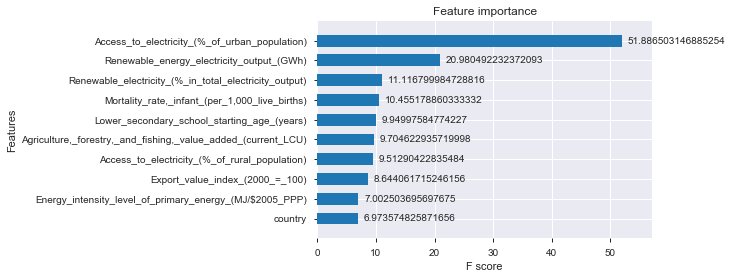

In [9]:
xgb=XGBRegressor(objective='reg:squarederror',n_jobs=-1,n_estimators=5000,subsample=0.75,colsample_bytree=0.75,\
                colsample_bylevel=0.75,learning_rate=0.06)
xgb.fit(Xtrain,ytrain, eval_set=[(Xtrain,ytrain),(Xval,yval)],eval_metric='rmse', early_stopping_rounds=70)

plot_importance(xgb,max_num_features=10, importance_type='gain',height=0.6)

#### Temp

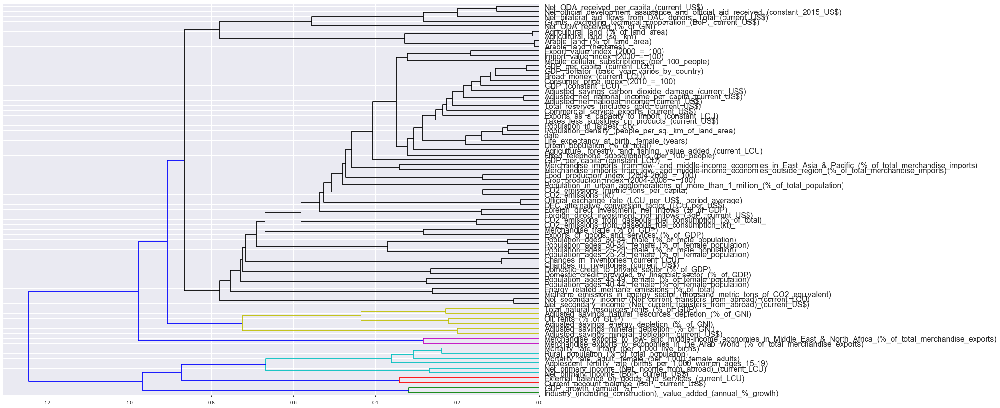

In [22]:
corr = np.round(scipy.stats.spearmanr((Train[HighCorrList]),nan_policy='omit').correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(20,15))
dendrogram = hc.dendrogram(z, labels=Train[HighCorrList].columns, orientation='left', leaf_font_size=16)
plt.show()

In [24]:
HighCorr=(Train.corr()>0.8).sum()
HighCorrList=[i for i,j in HighCorr.items() if j>1];HighCorrList

# tokeep=['Export_value_index_(2000_=_100)','GDP_per_capita_(current_LCU)','Adjusted_savings_carbon_dioxide_damage_(current_US$)',\
#  'Adjusted_savings_energy_depletion_(%_of_GNI)','Population_density_(people_per_sq._km_of_land_area)','Urban_population_(%_of_total)',\
#  'Agriculture,_forestry,_and_fishing,_value_added_(current_LCU)','Food_production_index_(2004-2006_=_100)',\
#  'CO2_emissions_(metric_tons_per_capita)','Official_exchange_rate_(LCU_per_US$,_period_average)', 'Foreign_direct_investment,_net_inflows_(%_of_GDP)',\
#  'CO2_emissions_from_gaseous_fuel_consumption_(kt)_', 'Population_ages_30-34,_female_(%_of_female_population)',\
#  'Population_ages_25-29,_male_(%_of_male_population)','Changes_in_inventories_(current_US$)','Net_ODA_received_per_capita_(current_US$)',\
# 'Net_secondary_income_(Net_current_transfers_from_abroad)_(current_US$)','Agricultural_land_(%_of_land_area)','Arable_land_(%_of_land_area)']

# Remove=[i for i in HighCorrList if i not in tokeep]

['Urban_population_(%_of_total)',
 'Population_density_(people_per_sq._km_of_land_area)',
 'Agricultural_land_(sq._km)',
 'Agricultural_land_(%_of_land_area)',
 'Arable_land_(hectares)',
 'Arable_land_(%_of_land_area)',
 'Crop_production_index_(2004-2006_=_100)',
 'Food_production_index_(2004-2006_=_100)',
 'Foreign_direct_investment,_net_inflows_(BoP,_current_US$)',
 'Foreign_direct_investment,_net_inflows_(%_of_GDP)',
 'Net_bilateral_aid_flows_from_DAC_donors,_Total_(current_US$)',
 'Net_official_development_assistance_and_official_aid_received_(constant_2015_US$)',
 'Net_ODA_received_per_capita_(current_US$)',
 'CO2_emissions_from_gaseous_fuel_consumption_(kt)_',
 'CO2_emissions_from_gaseous_fuel_consumption_(%_of_total)_',
 'CO2_emissions_(kt)',
 'CO2_emissions_(metric_tons_per_capita)',
 'Population_in_largest_city',
 'Total_reserves_(includes_gold,_current_US$)',
 'Broad_money_(current_LCU)',
 'Consumer_price_index_(2010_=_100)',
 'Mobile_cellular_subscriptions_(per_100_people)',

### PLOTS

#### PDPBox

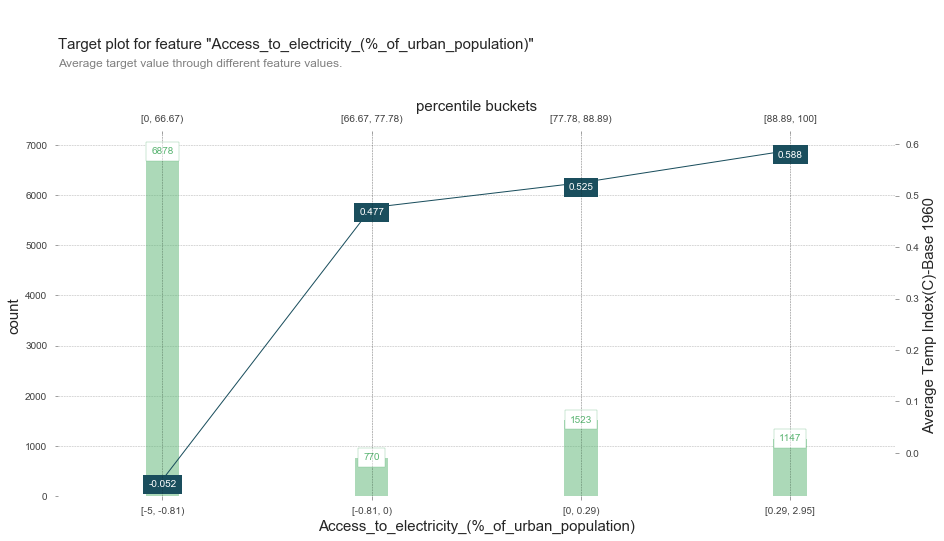

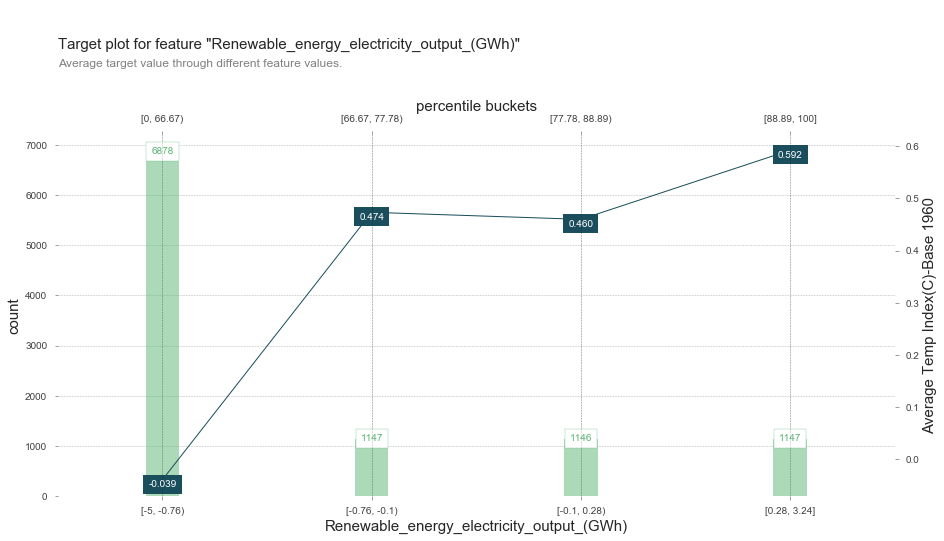

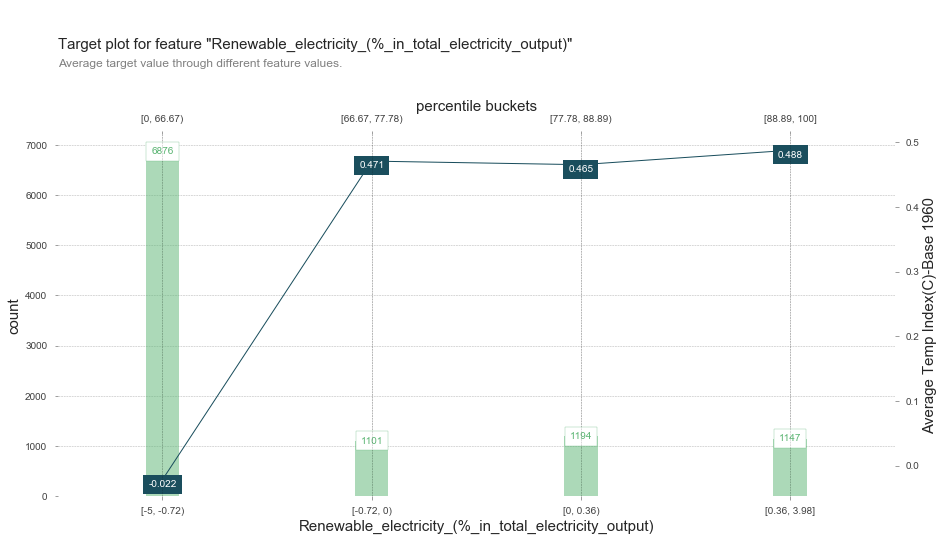

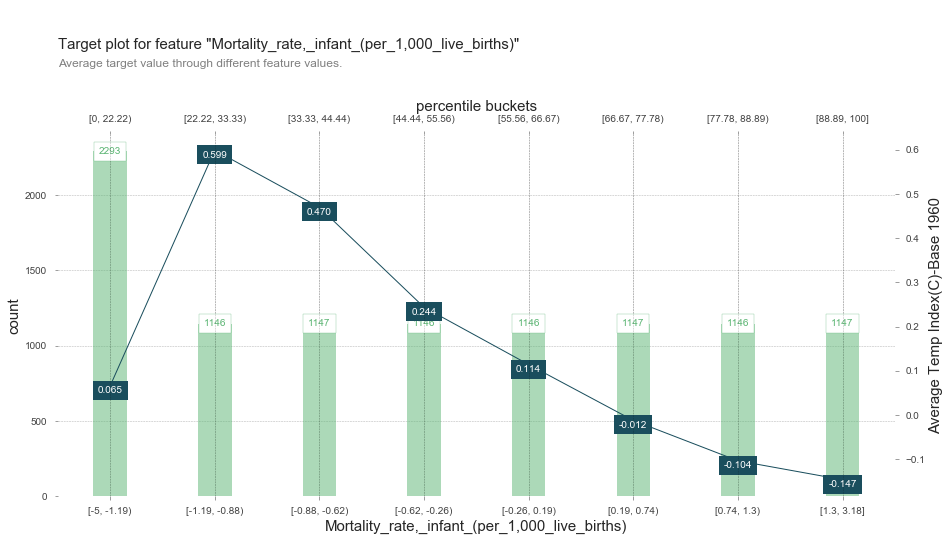

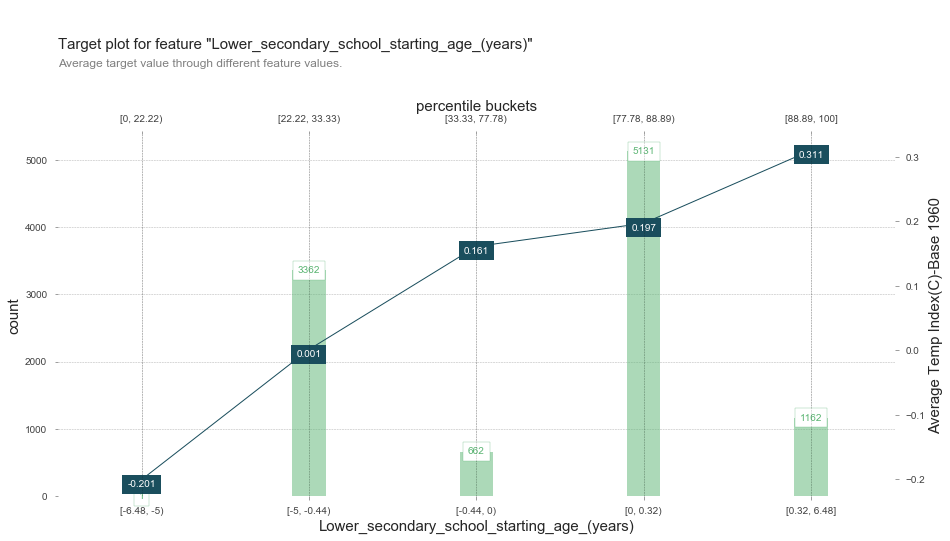

...

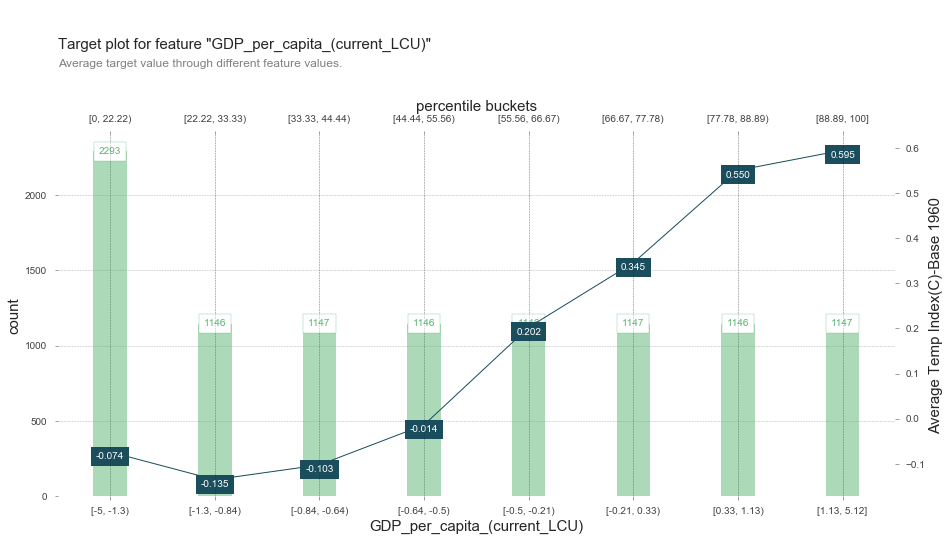

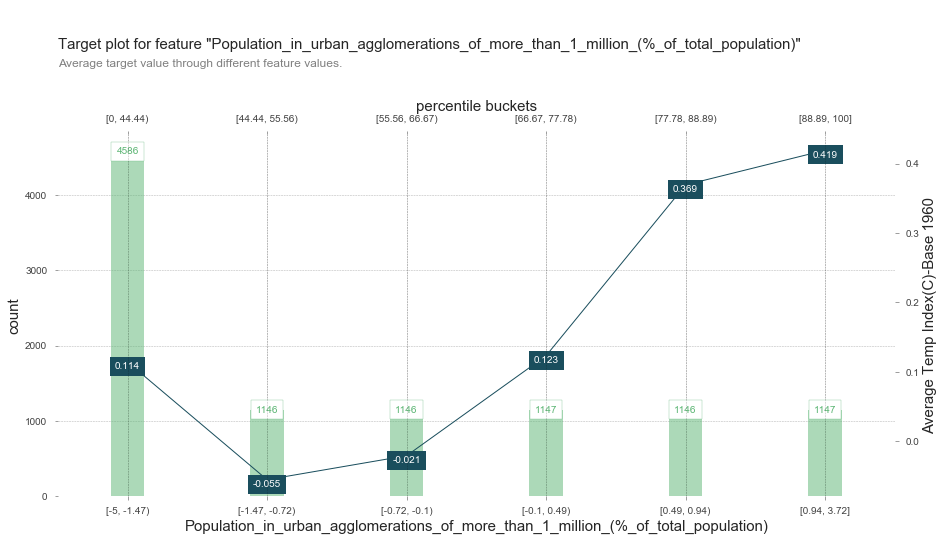

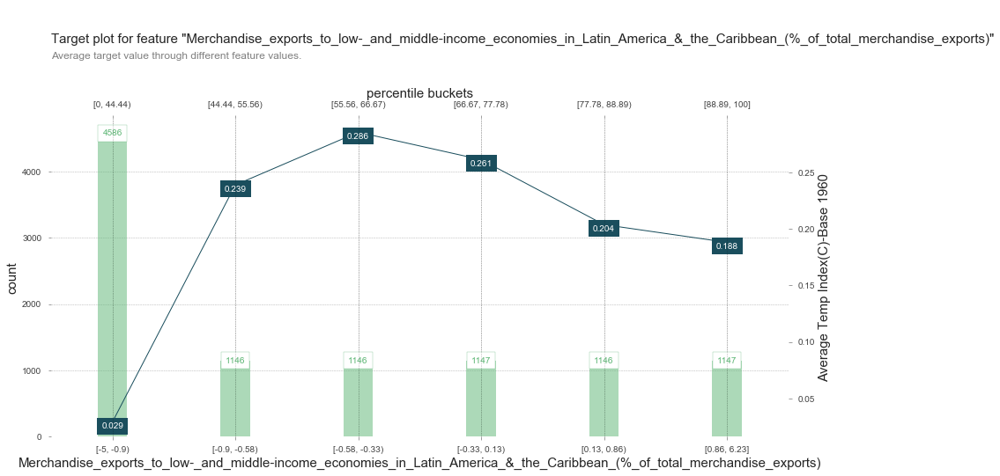

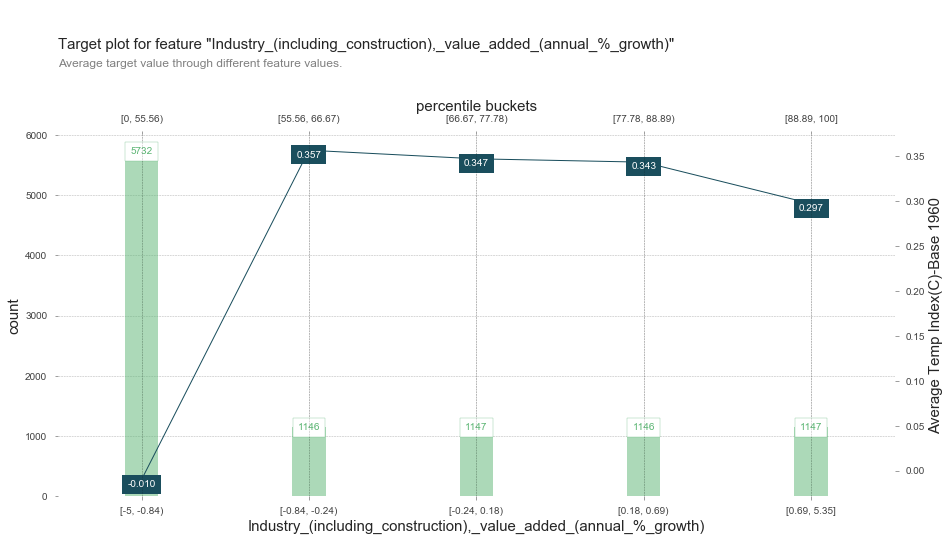

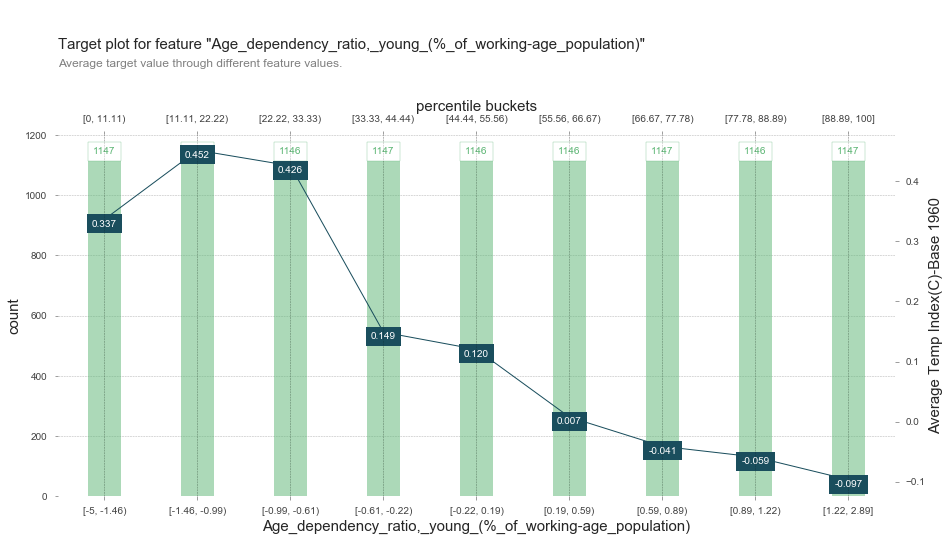

In [123]:
sns.set_context(rc={'axes.labelsize':15})
for i in FiList[0:20]:
    fig, axes, summary_df = info_plots.target_plot(df=Train.replace(np.nan,-5), show_percentile=True,\
    feature=i, feature_name=i\
    , target='Temp Index(C)-Base 1960')

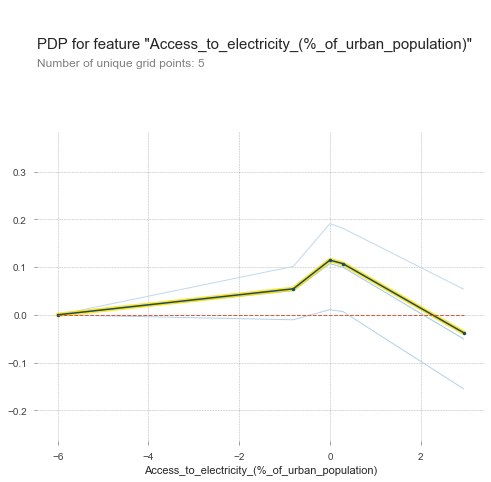

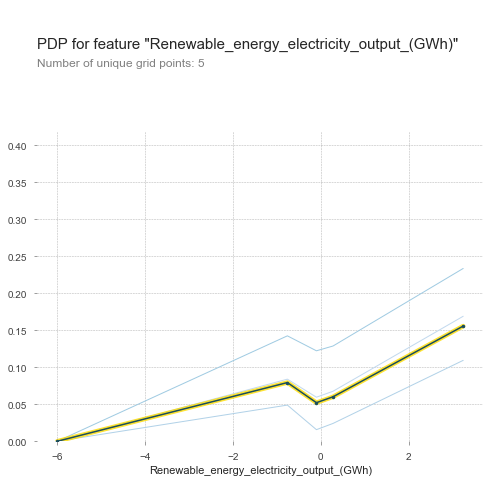

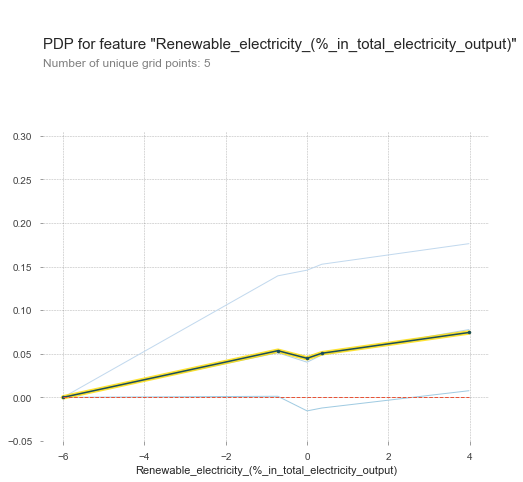

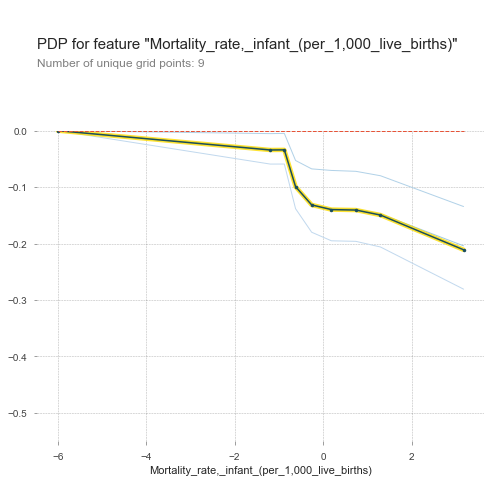

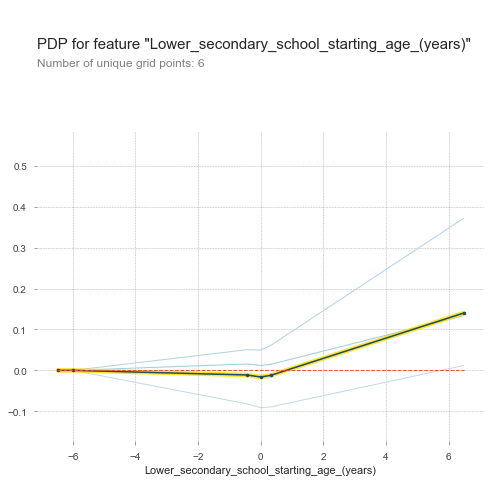

...

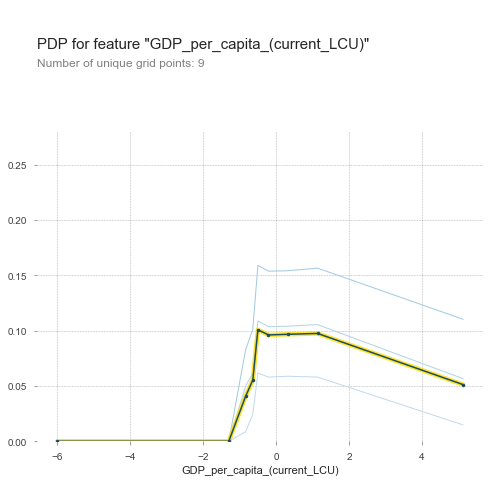

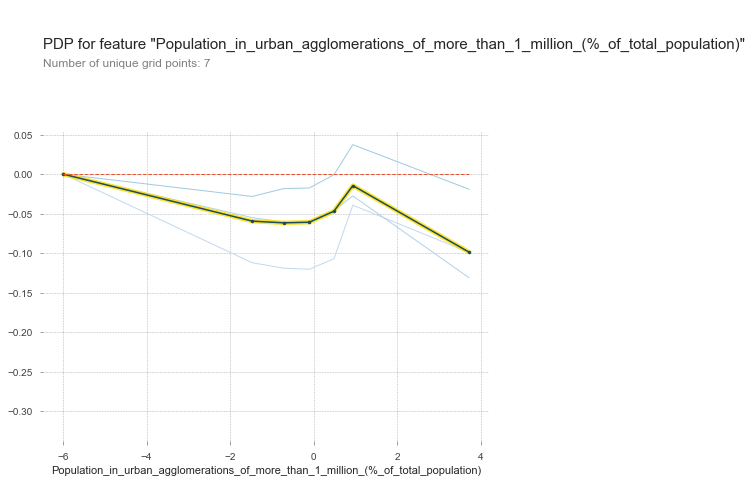

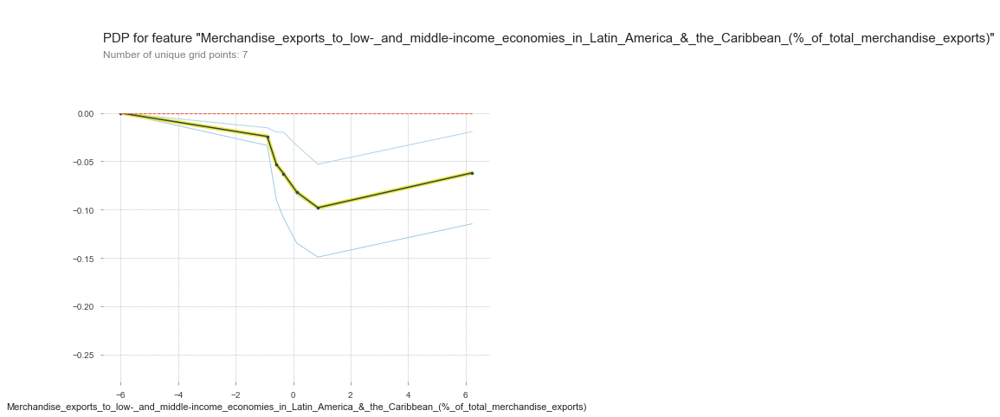

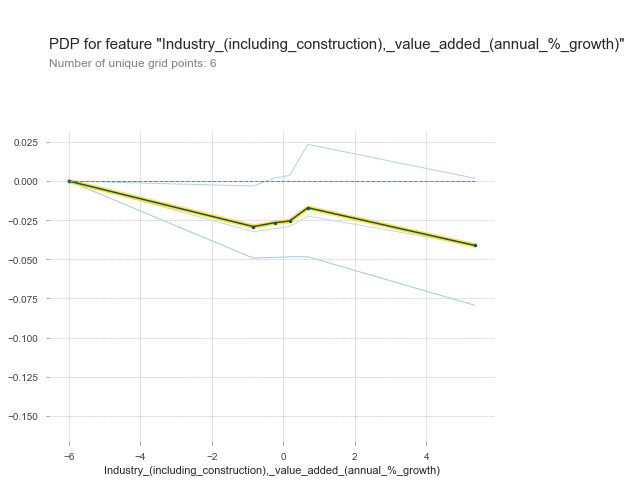

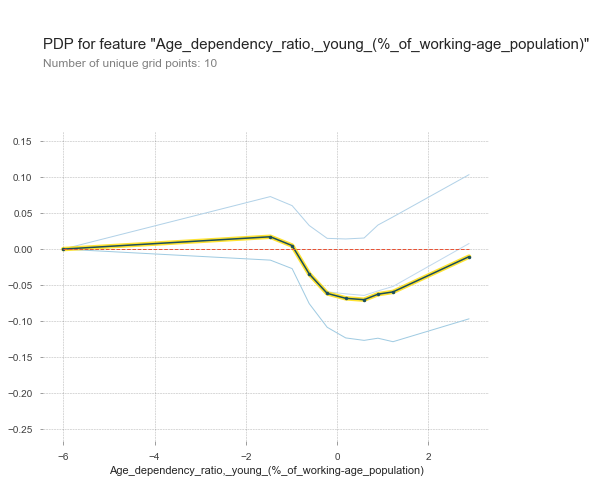

In [11]:
for i in FiList[0:20]:
    pdp_Train = pdp.pdp_isolate(
    model=xgb, dataset=Train.replace(np.nan,-6), model_features=Xtrain.columns, feature=i,num_grid_points=10)
    fig, axes = pdp.pdp_plot(pdp_Train, i, plot_lines=False, frac_to_plot=1, cluster=True,\
                        n_cluster_centers=3, figsize=(8,8))

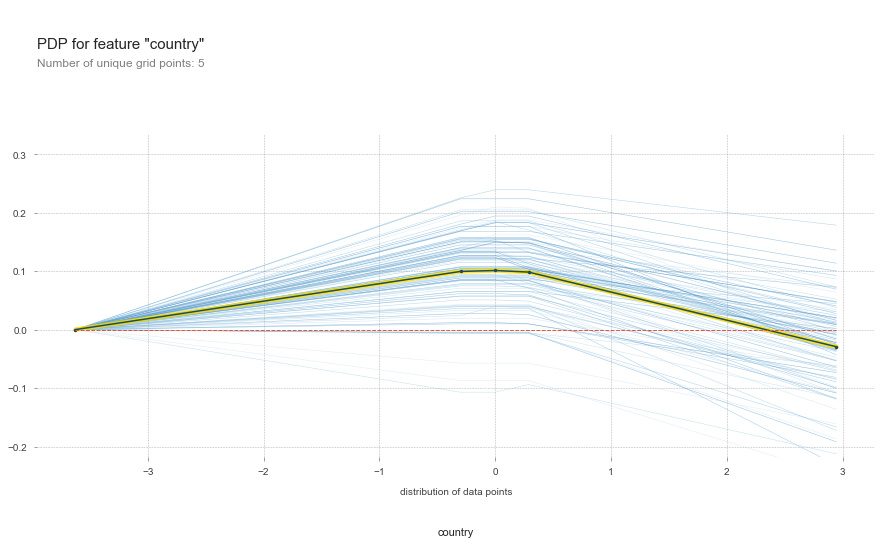

In [83]:
fig, axes = pdp.pdp_plot(pdp_Train, 'country', plot_lines=True, frac_to_plot=100, plot_pts_dist=True)

In [127]:
fig, axes, summary_df = info_plots.actual_plot(model=xgb, X=Train.replace(np.nan,0),\
feature=FiList[0],\
feature_name=FiList[0])

#### Bivariates

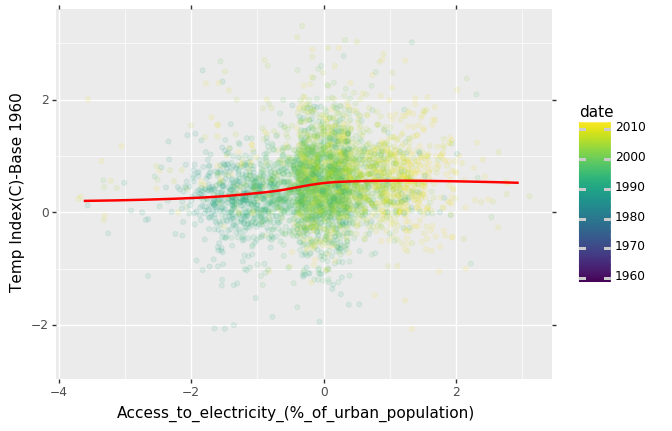

<ggplot: (-9223371897687032881)>


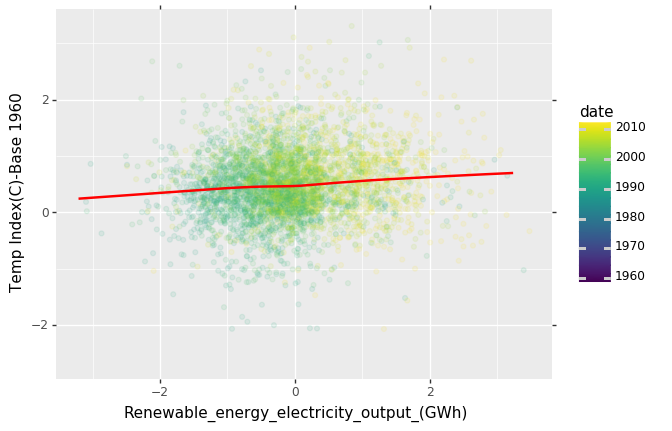

<ggplot: (-9223371897690096615)>


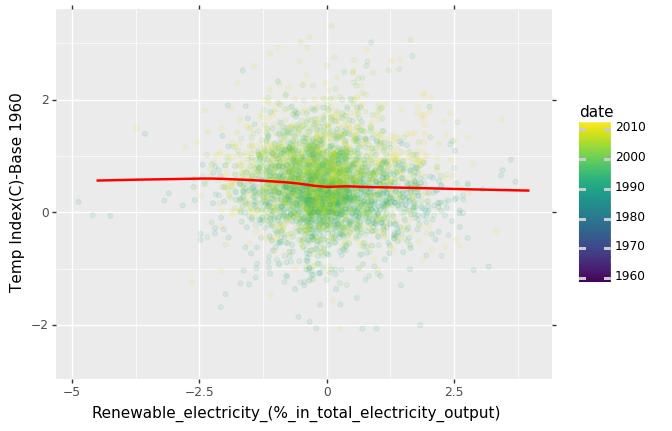

<ggplot: (-9223371897781984610)>


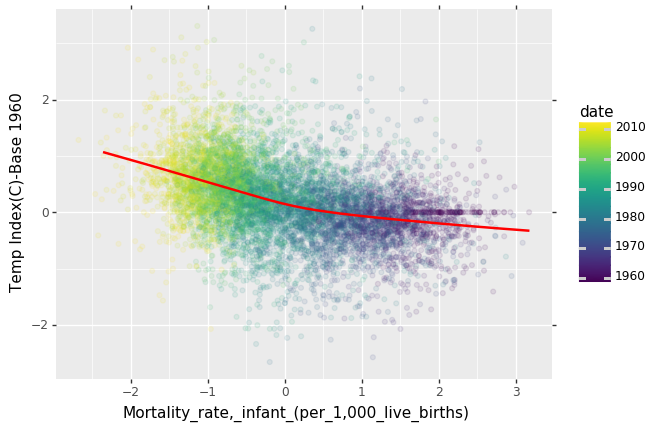

<ggplot: (-9223371897687079550)>


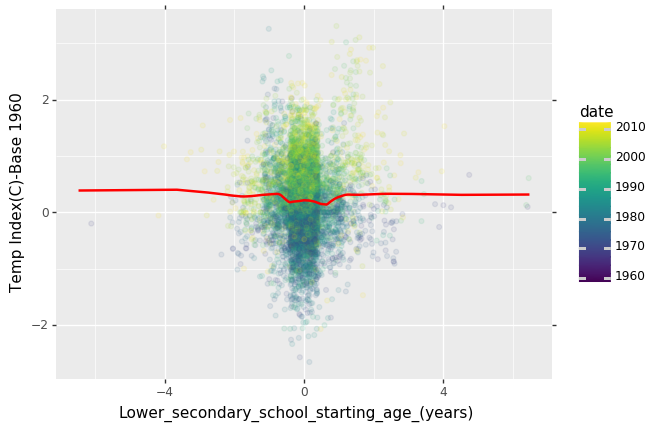

<ggplot: (-9223371897788898174)>


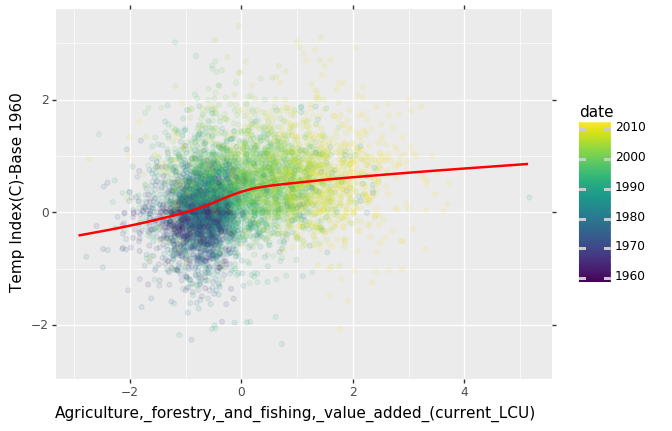

<ggplot: (-9223371897777475882)>


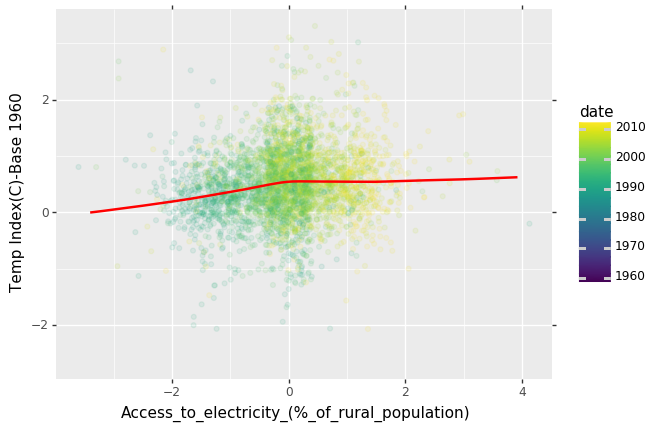

<ggplot: (139056211215)>


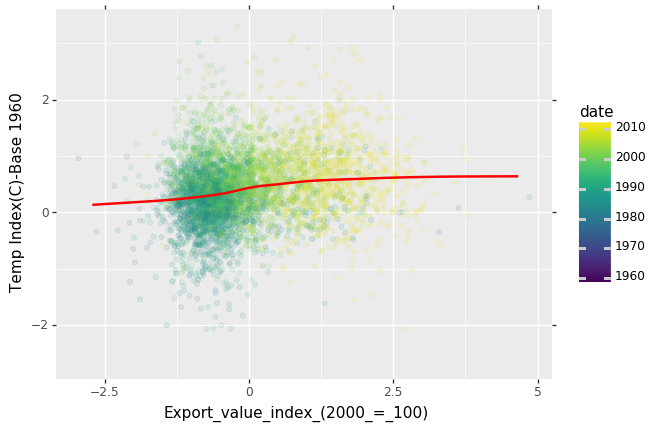

<ggplot: (-9223371897780219083)>


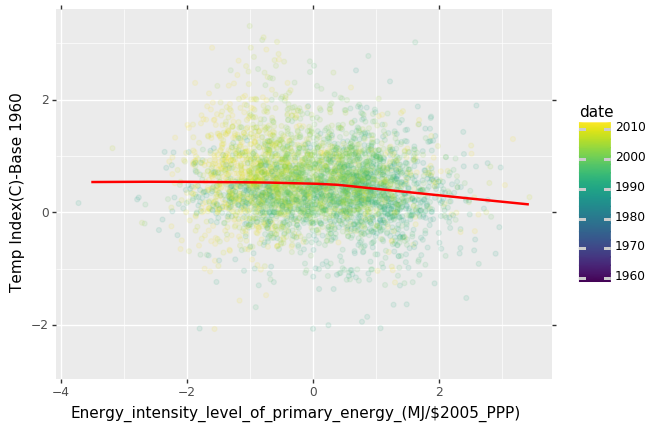

<ggplot: (139077159786)>


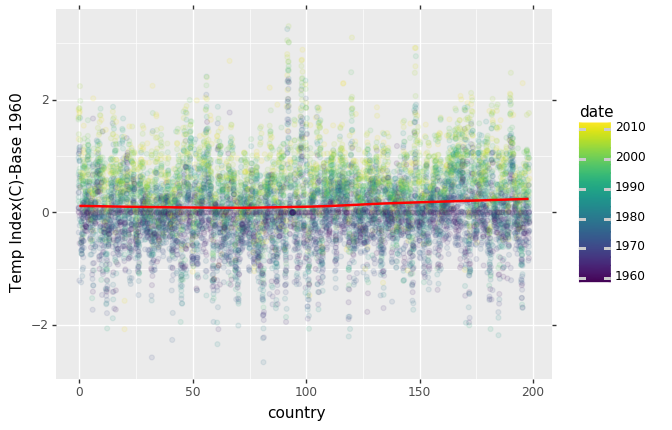

<ggplot: (139164406213)>


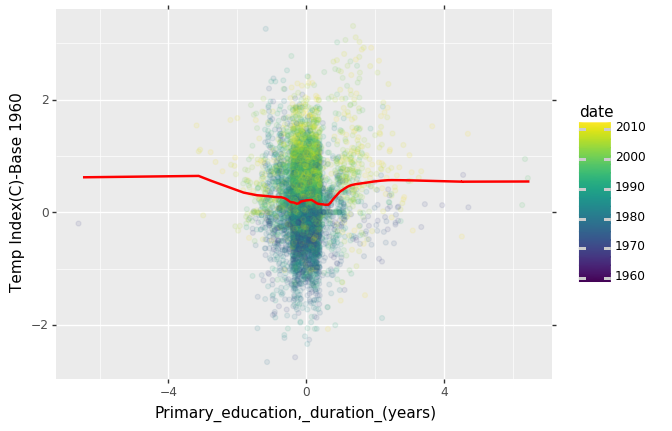

<ggplot: (-9223371897691806902)>


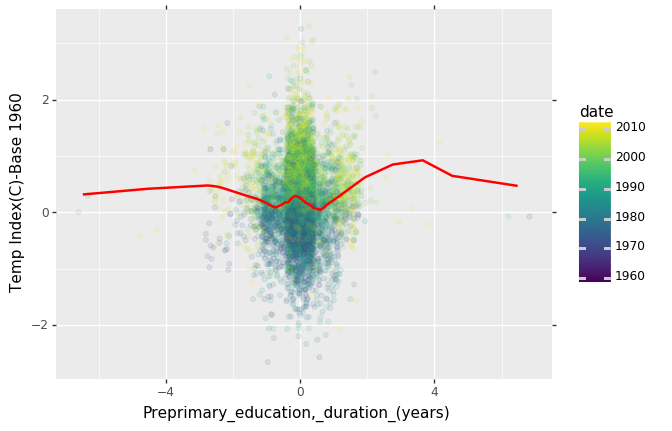

<ggplot: (139150082196)>


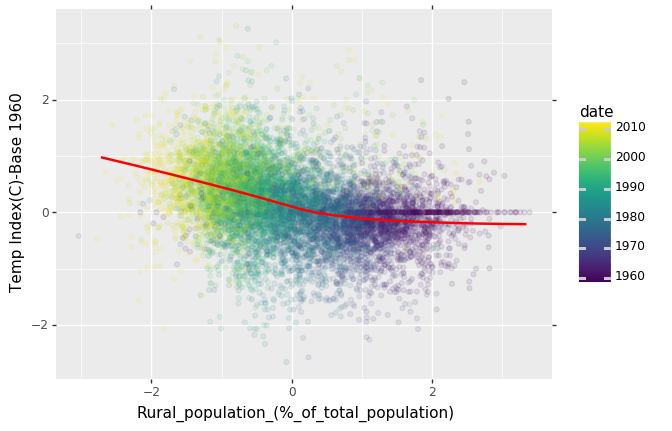

<ggplot: (139165132159)>


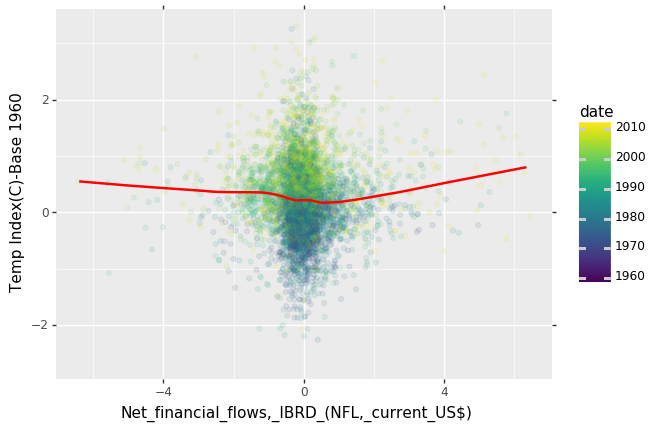

<ggplot: (139164282772)>


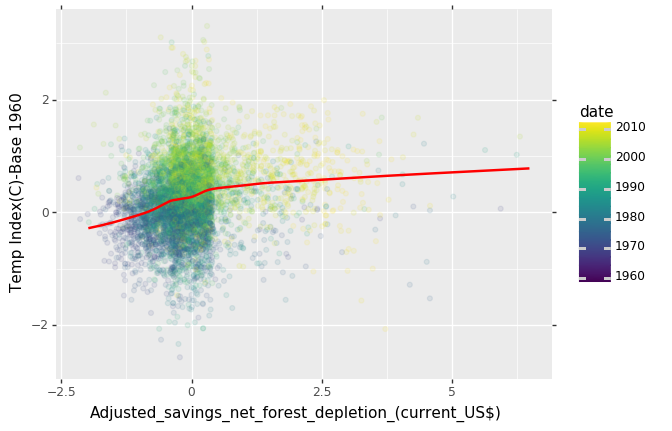

<ggplot: (139164379568)>


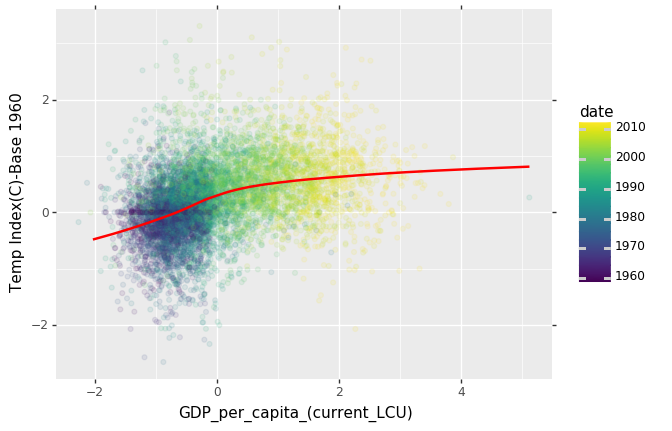

<ggplot: (-9223371897802804301)>


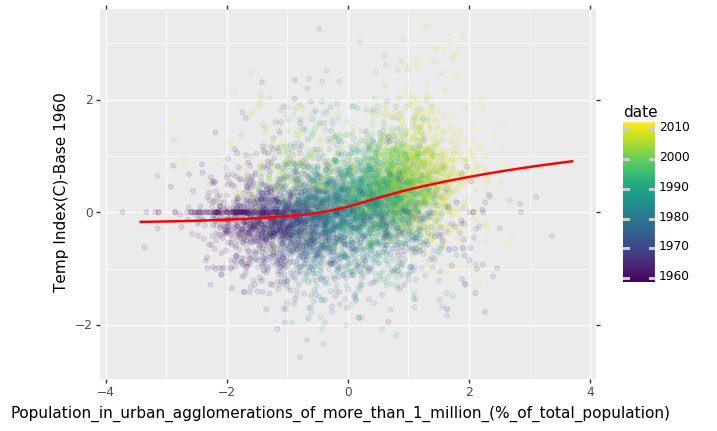

<ggplot: (139167652672)>


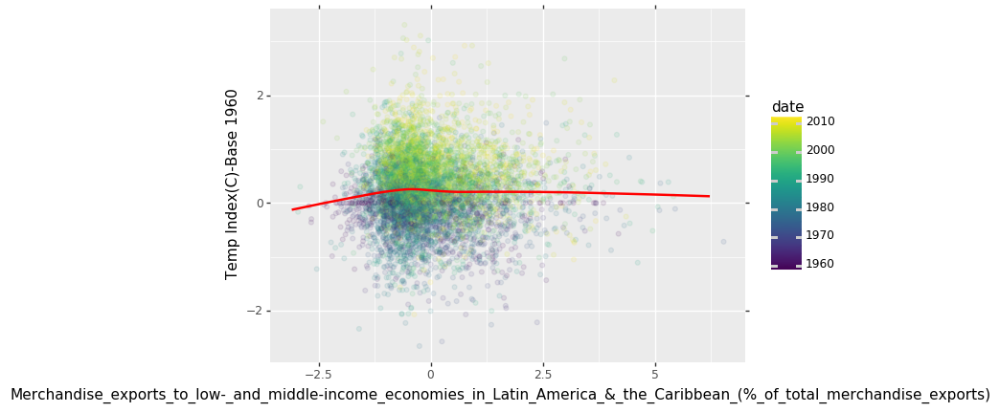

<ggplot: (-9223371897688462378)>


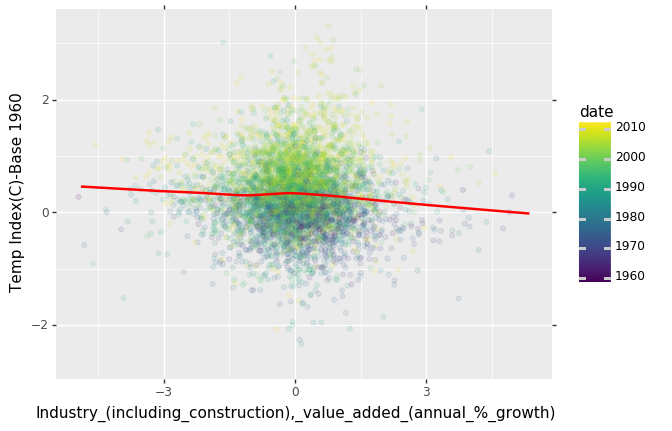

<ggplot: (139077056197)>


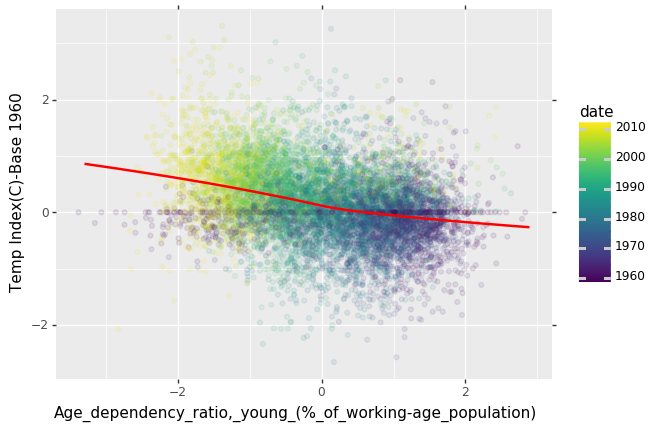

<ggplot: (-9223371897690025689)>


In [129]:
for i in FiList[0:20]:
    print(ggplot(Train, aes(i, 'Temp Index(C)-Base 1960',color='date'))+geom_jitter(alpha=0.1)\
    +stat_smooth(alpha=0.6,method='lowess',color='red'))

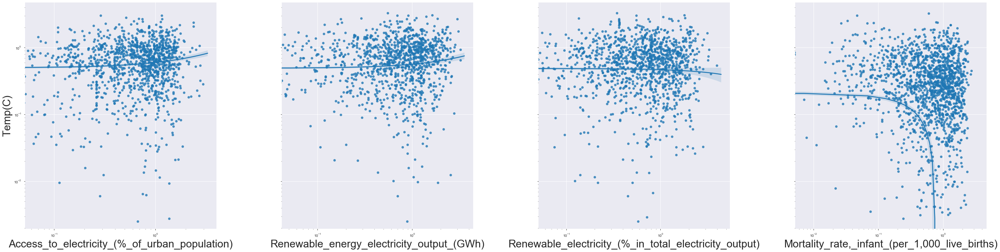

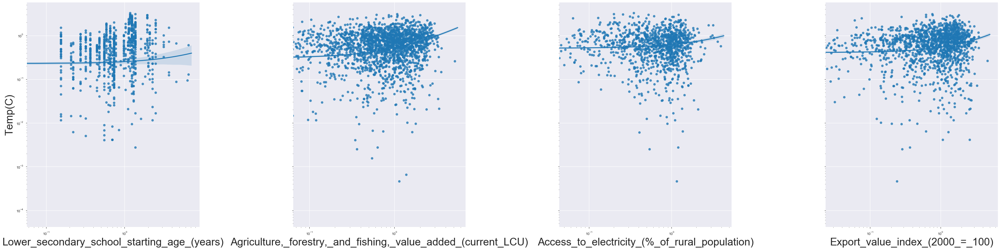

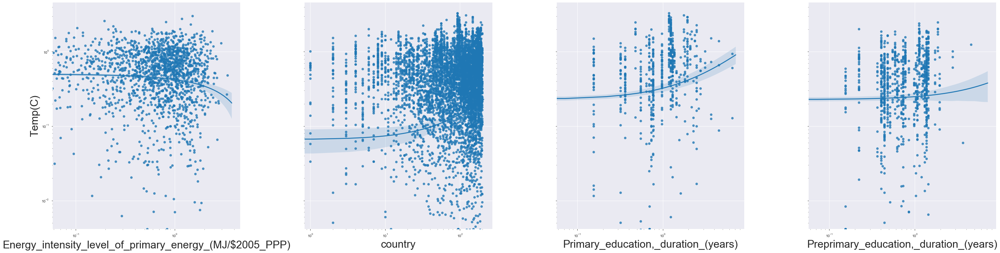

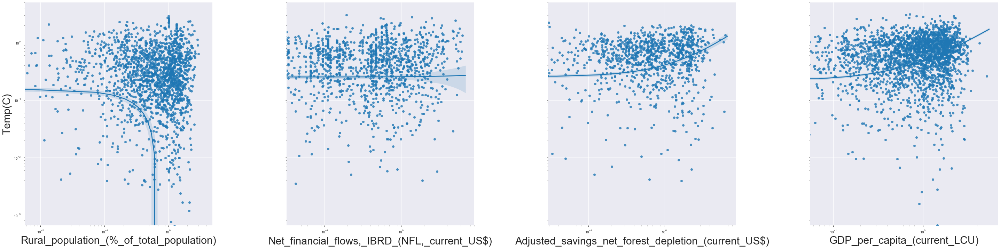

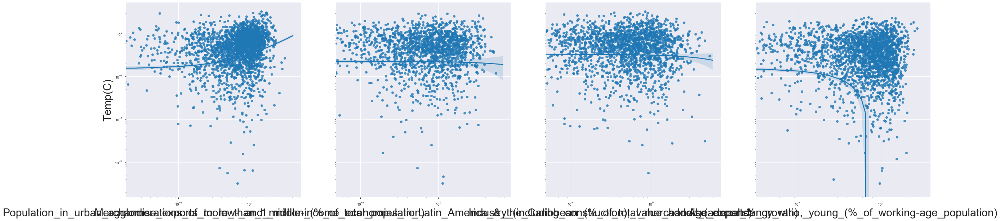

...

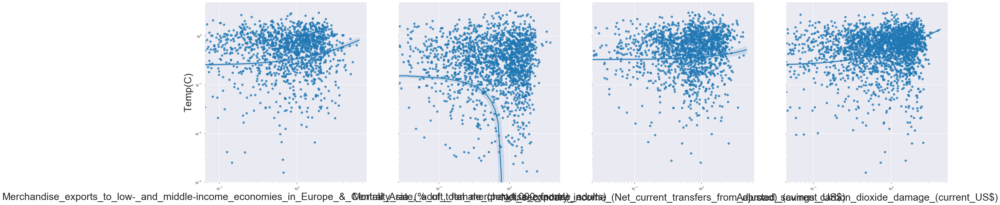

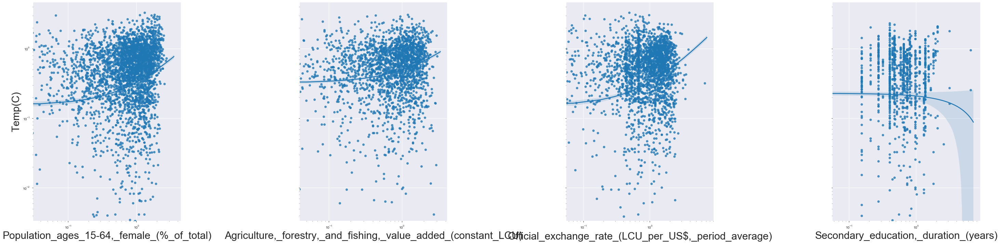

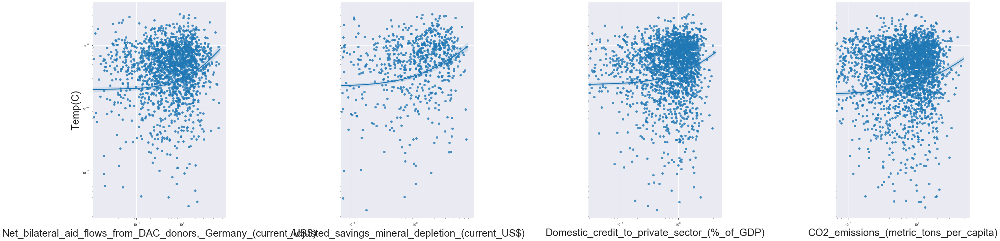

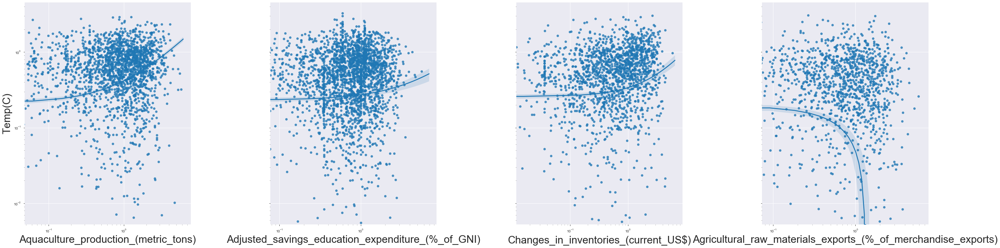

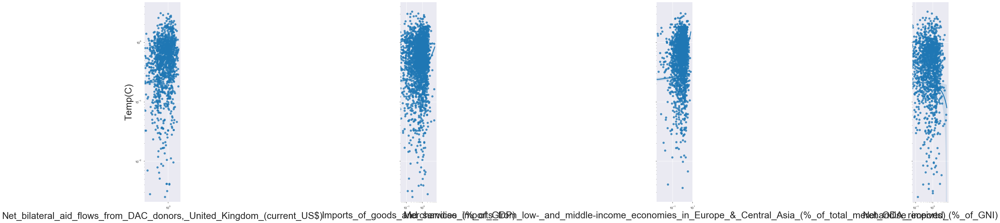

In [73]:
sns.set_context(rc={'axes.labelsize':30})
sns.pairplot(data=Train,x_vars=[i for i in FiList[0:4]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[4:8]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[8:12]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[12:16]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[16:20]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[20:24]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[24:28]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[28:32]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[32:36]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[36:40]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[40:44]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[44:48]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[48:52]],y_vars='Temp(C)',height=10,kind='reg').set(yscale='log',xscale='log')

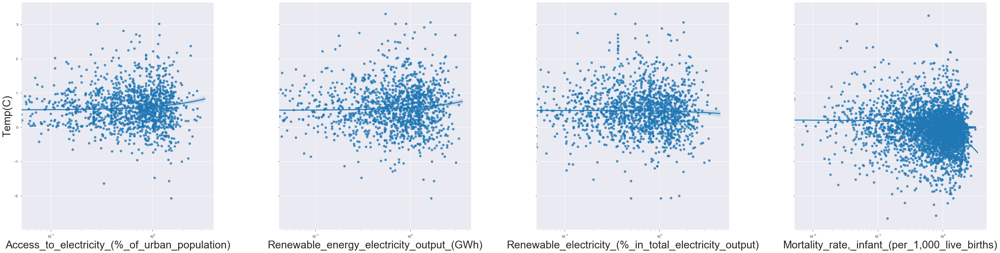

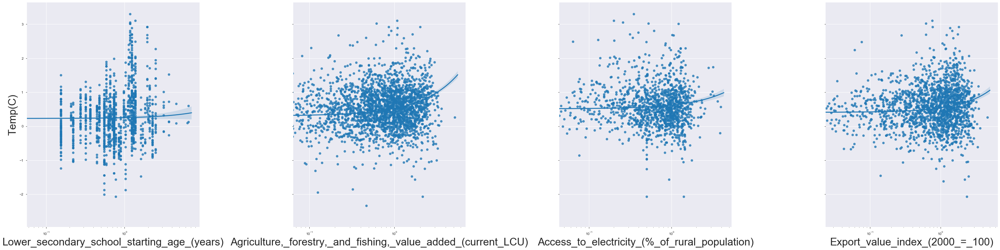

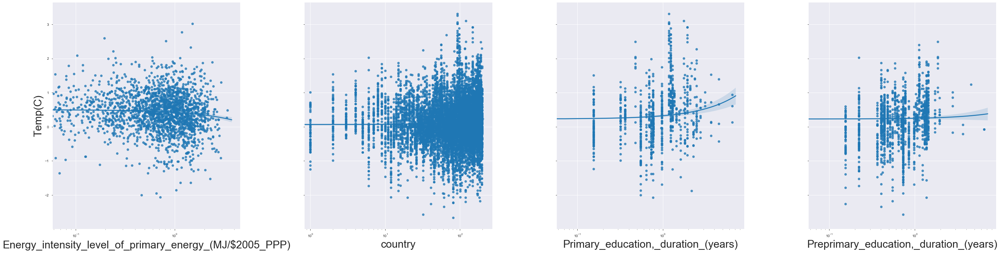

In [89]:
sns.set_context(rc={'axes.labelsize':30})
sns.pairplot(data=Train,x_vars=[i for i in FiList[0:4]],y_vars='Temp(C)',height=10,kind='reg').set(xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[4:8]],y_vars='Temp(C)',height=10,kind='reg').set(xscale='log')
sns.pairplot(data=Train,x_vars=[i for i in FiList[8:12]],y_vars='Temp(C)',height=10,kind='reg').set(xscale='log')

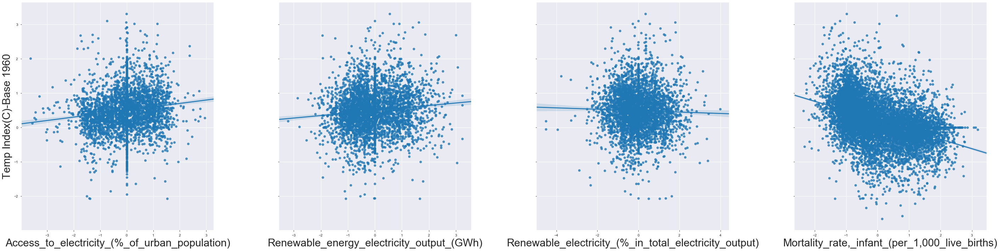

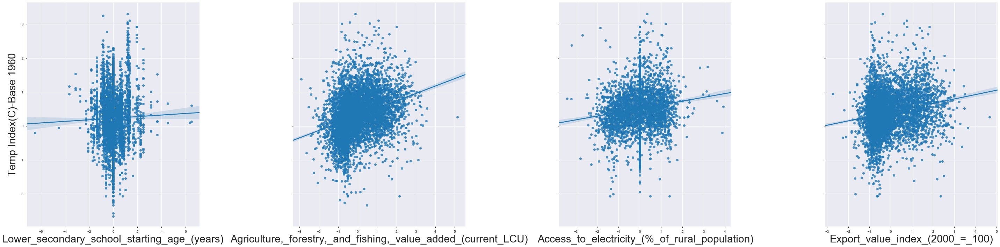

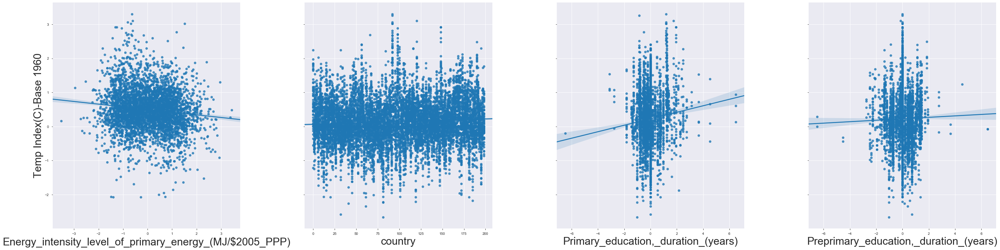

In [108]:
sns.set_context(rc={'axes.labelsize':30})
sns.pairplot(data=Train,x_vars=[i for i in FiList[0:4]],y_vars='Temp Index(C)-Base 1960',height=10,kind='reg')
sns.pairplot(data=Train,x_vars=[i for i in FiList[4:8]],y_vars='Temp Index(C)-Base 1960',height=10,kind='reg')
sns.pairplot(data=Train,x_vars=[i for i in FiList[8:12]],y_vars='Temp Index(C)-Base 1960',height=10,kind='reg')